# **Installing new libraries**

In [0]:
!pip install --upgrade pip --q
!pip install statsforecast --q
!pip install kneed --q
!pip install lightgbm --q

# **Importing libraries**

In [0]:
import pandas as pd
import datetime as dt
import numpy as np
import pyspark.pandas as ps
from datetime import datetime
from datetime import date
from datetime import timedelta
from datetime import tzinfo
import pytz
import pyspark.sql.functions as F
import kneed
from kneed import DataGenerator
from kneed import KneeLocator
%matplotlib inline
import copy
import time

import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.distributions.empirical_distribution import ECDF
import copy
from scipy import stats
import os
import scipy
import pyspark.sql.functions as fn

from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA

from sklearn import preprocessing
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import FunctionTransformer

# Models
from sklearn.linear_model import LinearRegression # Linear regression
import lightgbm as lgb # Gradient Boosting Trees



/databricks/python_shell/dbruntime/PythonPackageImportsInstrumentation/__init__.py:171: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  original_result = python_builtin_import(name, globals, locals, fromlist, level)


# **Connectivity setup and generic functions**

In [0]:
user_nm='SMAIT05'
snow_enc_pswd_key='SnowEncPswdKey'
snow_enc_pswd_pass='SnowEncPswdPass'
scope_nm='SNF-DOPS-USER-DB-{}-SCP'.format(user_nm)
snow_url='abs_itds_prd.west-us-2.privatelink.snowflakecomputing.com'

from absplatform import snowflake

private_key = snowflake.Snowflake(spark, scope_nm, snow_enc_pswd_key, snow_enc_pswd_pass).get_key()

snfKey  = dbutils.secrets.get(scope=scope_nm, key="SnowEncPswdKey")
snfPass = dbutils.secrets.get(scope=scope_nm, key="SnowEncPswdPass")
snfUser = dbutils.secrets.get(scope=scope_nm, key="SnowUsername")

#ADLS
adls_connection_dict={'adls_server_hostname': 'adb-3055846038102621.1.azuredatabricks.net',
                      'http_path': 'sql/protocolv1/o/3055846038102621/0315-150338-eerie83',
                      'access_token_scope':'scp_itds_devops',
                      'access_token_key' : 'dasc-prod-databricks-01-dbx-key'                        
                          }
#db_work dev/prod paths
pathADLSdev = 'abfs://absitdsdevwussa001@absitdsdevwussa001.dfs.core.windows.net/itds/dev/default/work/'
pathADLSprd = 'abfs://absitdsprodwussa001@absitdsprodwussa001.dfs.core.windows.net/default/work/datascience/'


In [0]:
# EDM connection parameters 
ITDSreadOptions = dict(sfUrl=snow_url,
               sfUser=user_nm,
               pem_private_key=private_key,
               sfDatabase="EDM_FEATURES_PRD",
               sfSchema="SCRATCH_DS",
               sfWarehouse="EDM_DATASCIENCE_WH",
               sfRole="ROLE_USERGROUP_DATASCIENTIST")

# EDM connection parameters 
ITDSwriteOptions = dict(sfUrl=snow_url,
               sfUser=user_nm,
               pem_private_key=private_key,
               sfDatabase="EDM_FEATURES_PRD",
               sfSchema="SCRATCH_DS",
               sfWarehouse="EDM_DATASCIENCE_WH",
               sfRole="ROLE_USERGROUP_DATASCIENTIST")

In [0]:
def read_snowflake(env, sql, role, sys='prd'):
    """
    This method reads from snowflake database.
    """
    try:
        if (env == 'edm' and sys == 'prd'):
            swOptions = ITDSreadOptions
        elif(env == 'edm' and sys == 'dev'):
            swOptions = ITDSreadOptionsDev
        else:
            raise Exception('Configuration not found for environment {}.'.format(env))
    except Exception as e:
        raise Exception('Configuration not found for environment {}.'.format(env, e))

    df = spark.read\
      .format("snowflake")\
      .options(**swOptions)\
      .option("query", sql)\
      .load()
    df = df.toDF(*[c.lower() for c in df.columns])
    return df

In [0]:
def write_snowflake(env, sql, table, write_mode):
    """
    This method writes back to snowflake database.
    """
    try:
        if (env == 'edw'):
            swOptions = EDWwriteOptions
        elif (env == 'edm'):
            swOptions = ITDSwriteOptions
        else:
            raise Exception('Configuration not found for environment {}.'.format(env))
    except Exception as e:
        raise Exception('Configuration not found for environment {}.'.format(env, e))

    (spark.sql(query)
     .write
     #.mode("APPEND")
     .mode(write_mode)
     .format("snowflake")
     .options(**swOptions)
     .option("truncate_table", "on")
    .option("usestagingtable", "off")
    .option("dbtable", table)
    .save()
    ) 


In [0]:
def ecdf(a):
    x, counts = np.unique(a, return_counts=True)
    cusum = np.cumsum(counts)
    return x, cusum / cusum[-1]
    
def plot_ecdf(a):
    x, y = ecdf(a)
    x = np.insert(x, 0, x[0])
    y = np.insert(y, 0, 0.)
    plt.plot(x, y, drawstyle='steps-post')
    plt.grid(True)
    plt.savefig('ecdf.png')

# **Read database table**

In [0]:
'''
unique_id is the combination of 2 digit division and 2 digit smic group code. 
statsforeacst algorithm expects the columns unique_id, ds and y where ds is the timestamp column and
y is the fact data which needs to be foreacsted.
ds column is the month end date in the format of yyyy-mm-dd.
y denotes total units sold at div-grp-mth level.
'''
sql_stmt = """SELECT division_id || LPAD(smic_group_cd, 2, '0')                                                          AS unique_id
                   , LAST_DAY(CAST((SUBSTR(txn_cal_yr_mth,1,4) || '-' || SUBSTR(txn_cal_yr_mth,5,2) || '-01') AS DATE))  AS ds
                   , total_item_qty                                                                                      AS y 
              FROM   edm_bizops_prd.data_science.div_grp_cal_yr_mth_agg_3
              WHERE  SUBSTR(txn_cal_yr_mth,1,4) > 2020
           """.replace("\n", " ").replace("\t"," ")
df = read_snowflake('edm', sql_stmt, 'regular' ,'prd')
pd_df = df.toPandas()
pd_df["ds"]=pd.to_datetime(pd_df["ds"])
df.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:91: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [y] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(
+---------+----------+-------+
|unique_id|        ds|      y|
+---------+----------+-------+
|     3036|2021-03-31|2617228|
|     3003|2021-03-31|1852274|
|     3008|2021-03-31|1733370|
|     3001|2021-03-31|1475983|
|     3009|2021-03-31|1391723|
|     3037|2021-03-31|1015100|
|     3048|2021-03-31| 995751|
|     3038|2021-03-31| 831951|
|     3025|2021-03-31| 824710|
|     3002|2021-03-31| 729041|
|     3011|2021-03-31| 693989|
|     3029|2021-03-31| 619894|
|     3042|2021-03-31| 619496|
|     3032|2021-03-31| 595488|
|     3005|2021-03-31| 515828|
|     3028|2021-03-31| 426105|
|     3021|2021-03-31| 405380|
|     3047|2021-03-31| 399227|
|     3020|2021-03-31| 395225|
|     3019|

In [0]:
# Obtaining latest month's data to do analysis on ECDF
pd_df_latest_mth = pd_df[pd_df.ds == pd_df['ds'].max()]
pd_df_latest_mth['divison_id'] = pd_df_latest_mth['unique_id'].apply(lambda x : x[:2])
pd_df_latest_mth.sort_values(by=['divison_id','y'],ascending=[True, False])

<command-1236937830464536>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_df_latest_mth['divison_id'] = pd_df_latest_mth['unique_id'].apply(lambda x : x[:2])


,unique_id,ds,y,divison_id
21139,0536,2023-03-31,3288906,05
21140,0508,2023-03-31,2161882,05
21141,0503,2023-03-31,2111822,05
21142,0509,2023-03-31,1910716,05
21143,0537,2023-03-31,1545401,05
...,...,...,...,...
22843,3477,2023-03-31,23469,34
22844,3461,2023-03-31,17291,34
22845,3480,2023-03-31,17081,34
22846,3469,2023-03-31,7004,34


In [0]:
pd_analysis_df = copy.deepcopy(pd_df)
pd_analysis_df['divison_id'] = pd_analysis_df['unique_id'].apply(lambda x : x[:2])
division_id_list = sorted(pd_analysis_df['divison_id'].drop_duplicates().tolist())
mth_end_dt_list = sorted(pd_analysis_df['ds'].drop_duplicates().tolist())

In [0]:
pd_analysis_df

,unique_id,ds,y,divison_id
0,2036,2021-02-28,3334042,20
1,2003,2021-02-28,2494114,20
2,2008,2021-02-28,2421234,20
3,2009,2021-02-28,2400675,20
4,2001,2021-02-28,1991088,20
...,...,...,...,...
23076,3346,2021-08-31,14053,33
23077,3361,2021-08-31,8987,33
23078,3369,2021-08-31,6772,33
23079,3380,2021-08-31,1715,33


An ECDF represents the proportion or count of observations falling below each unique value in a dataset. An ECDF is an estimator of the Cumulative Distribution Function. The ECDF essentially allows to plot a feature of the data in order from least to greatest and see the whole feature as if is distributed across the data set.

ECDF for division 05 with cut-off units with elbow at 665651(62%) for the month of 2021-01-31 00:00:00
ECDF for division 05 with cut-off units with elbow at 754151(66%) for the month of 2021-02-28 00:00:00
ECDF for division 05 with cut-off units with elbow at 870801(66%) for the month of 2021-03-31 00:00:00
ECDF for division 05 with cut-off units with elbow at 620409(63%) for the month of 2021-04-30 00:00:00
ECDF for division 05 with cut-off units with elbow at 591634(63%) for the month of 2021-05-31 00:00:00
ECDF for division 05 with cut-off units with elbow at 593565(64%) for the month of 2021-06-30 00:00:00
ECDF for division 05 with cut-off units with elbow at 628061(64%) for the month of 2021-07-31 00:00:00
ECDF for division 05 with cut-off units with elbow at 612637(63%) for the month of 2021-08-31 00:00:00
ECDF for division 05 with cut-off units with elbow at 645975(64%) for the month of 2021-09-30 00:00:00
ECDF for division 05 with cut-off units with elbow at 702677(63%) for the

,div,mth_end_dt,elbow,elbow_pctl
0,05,2021-01-31,665651,62
1,05,2021-02-28,754151,66
2,05,2021-03-31,870801,66
3,05,2021-04-30,620409,63
4,05,2021-05-31,591634,63
...,...,...,...,...
292,34,2022-11-30,1360119,57
293,34,2022-12-31,1013748,54
294,34,2023-01-31,979677,55
295,34,2023-02-28,748517,54


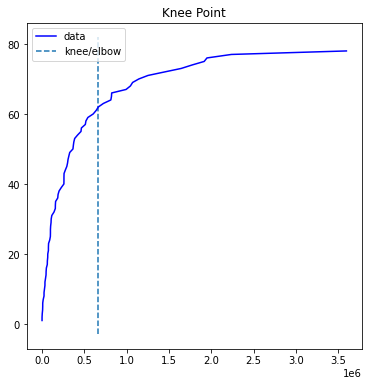

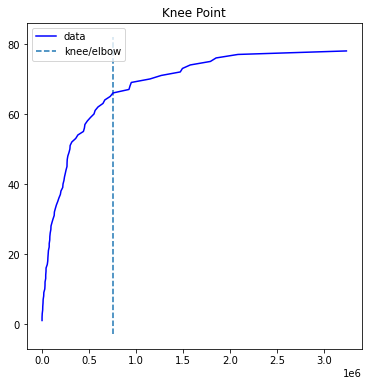

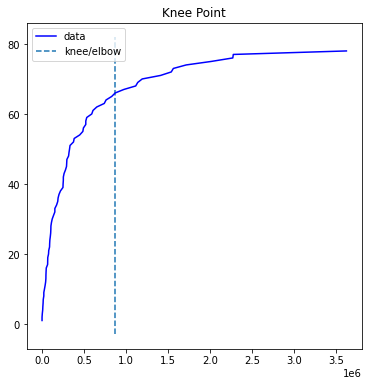

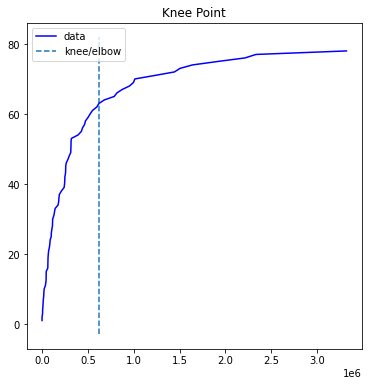

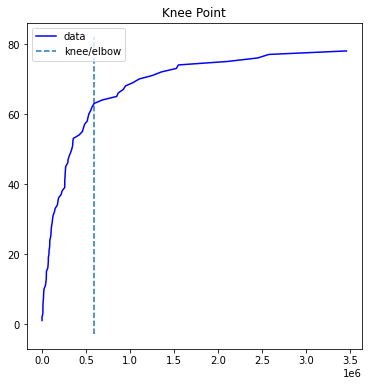

...

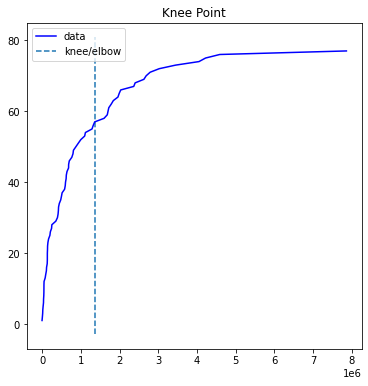

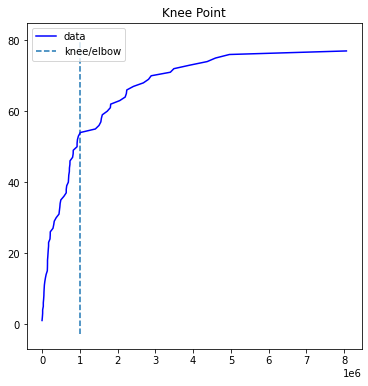

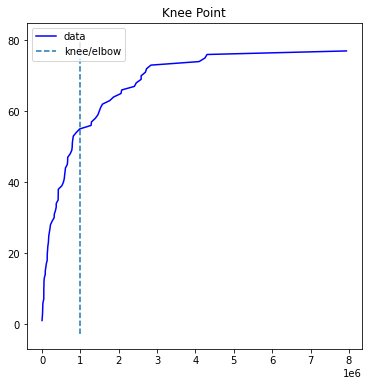

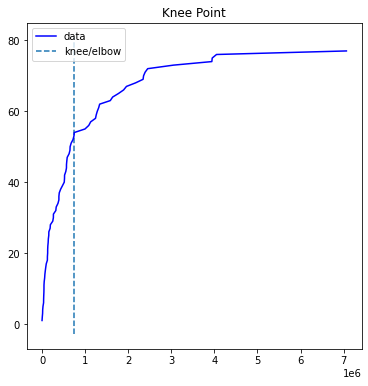

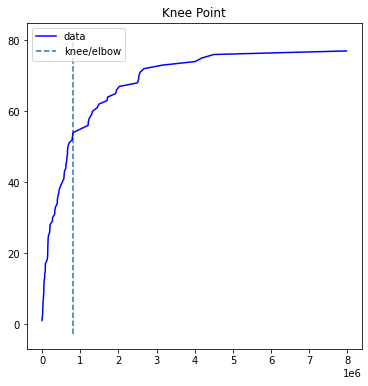

In [0]:
div_mth_knee_list = []
for div in division_id_list:
    for mth_end_dt in mth_end_dt_list:
        x = pd_analysis_df[(pd_analysis_df.ds == mth_end_dt) & (pd_analysis_df.divison_id == div)]['y']
        x1 = sorted([int(i) for i in x])
        y1 = range(1, len(x1)+1)
        kn = KneeLocator(x1, y1, curve='concave', direction='increasing')
        #plot_ecdf(x)
        print(f"ECDF for division {div} with cut-off units with elbow at {kn.knee}({kn.knee_y}%) for the month of {mth_end_dt}")
        div_mth_knee_list.append((div, mth_end_dt, kn.knee, kn.knee_y))
        #kn.plot_knee_normalized()
        kn.plot_knee()
        #plt.show(block = False)
pd_df_div_mth_eblow = pd.DataFrame(div_mth_knee_list, columns = ['div', 'mth_end_dt', 'elbow', 'elbow_pctl'])   
pd_df_div_mth_eblow.to_csv('div_mth_eblow.csv', index = False)
pd_df_div_mth_eblow     

In [0]:
pd_df_div_mth_eblow['mth_end_dt'] = pd_df_div_mth_eblow['mth_end_dt'].astype(str)
pd_df_div_mth_eblow['year_mth'] = pd_df_div_mth_eblow['mth_end_dt'].apply(lambda x : x[:7].replace("-",""))
pd_df_div_mth_eblow['year'] = pd_df_div_mth_eblow['mth_end_dt'].apply(lambda x : x[:4])
pd_df_div_mth_eblow['mth'] = pd_df_div_mth_eblow['mth_end_dt'].apply(lambda x : x[5:7])
pd_df_div_mth_eblow


,div,mth_end_dt,elbow,elbow_pctl,year_mth,year,mth
0,05,2021-01-31,665651,62,202101,2021,01
1,05,2021-02-28,754151,66,202102,2021,02
2,05,2021-03-31,870801,66,202103,2021,03
3,05,2021-04-30,620409,63,202104,2021,04
4,05,2021-05-31,591634,63,202105,2021,05
...,...,...,...,...,...,...,...
292,34,2022-11-30,1360119,57,202211,2022,11
293,34,2022-12-31,1013748,54,202212,2022,12
294,34,2023-01-31,979677,55,202301,2023,01
295,34,2023-02-28,748517,54,202302,2023,02


In [0]:
pd_df_div_mth_eblow_stats = pd_df_div_mth_eblow.groupby(['div', 'mth']).aggregate({'elbow' : [np.mean, np.max, np.min, np.median], 
                                                                                   'elbow_pctl' : [np.mean, np.max, np.min, np.median]
                                                                                  }
                                                                                ).reset_index()
pd_df_div_mth_eblow_stats.columns = ['div', 
                                     'mth', 
                                     'elbow_avg', 
                                     'elbow_max', 
                                     'elbow_min', 
                                     'elbow_median', 
                                     'elbow_pctl_avg', 
                                     'elbow_pctl_max', 
                                     'elbow_pctl_min',
                                     'elbow_pctl_median'
                                     ]
pd_df_div_mth_eblow_stats['elbow_avg'] = pd_df_div_mth_eblow_stats['elbow_avg'].apply(lambda x : np.round(x))
pd_df_div_mth_eblow_stats['elbow_pctl_avg'] = pd_df_div_mth_eblow_stats['elbow_pctl_avg'].apply(lambda x : np.round(x))
pd_df_div_mth_eblow_stats['elbow_pctl_median'] = pd_df_div_mth_eblow_stats['elbow_pctl_median'].apply(lambda x : np.round(x))
pd_df_div_mth_eblow_stats

,div,mth,elbow_avg,elbow_max,elbow_min,elbow_median,elbow_pctl_avg,elbow_pctl_max,elbow_pctl_min,elbow_pctl_median
0,05,01,788484.0,941133,665651,758669.0,64.0,65,62,64.0
1,05,02,592637.0,754151,298885,724874.0,61.0,66,53,64.0
2,05,03,632213.0,870801,326805,699034.0,61.0,66,53,64.0
3,05,04,470217.0,620409,320025,470217.0,58.0,63,54,58.0
4,05,05,597750.0,603866,591634,597750.0,64.0,64,63,64.0
...,...,...,...,...,...,...,...,...,...,...
127,34,08,1501440.0,1561774,1441107,1501440.5,62.0,63,62,62.0
128,34,09,1441820.0,1491452,1392188,1441820.0,62.0,62,61,62.0
129,34,10,871670.0,919678,823663,871670.5,54.0,54,53,54.0
130,34,11,1422918.0,1485716,1360119,1422917.5,58.0,58,57,58.0


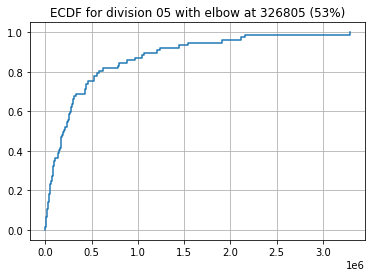

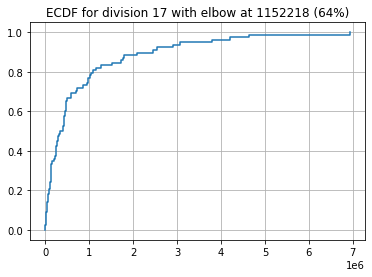

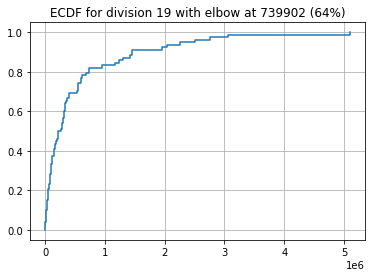

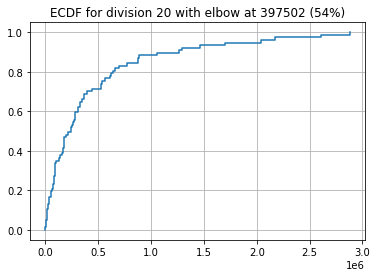

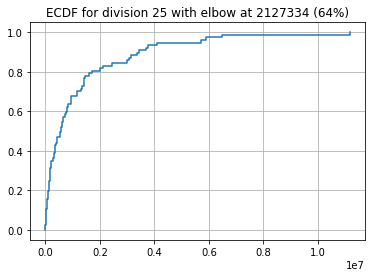

...

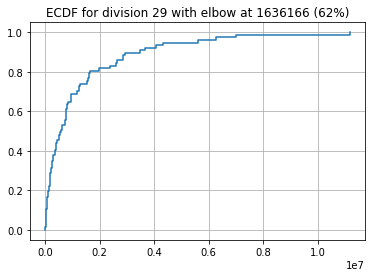

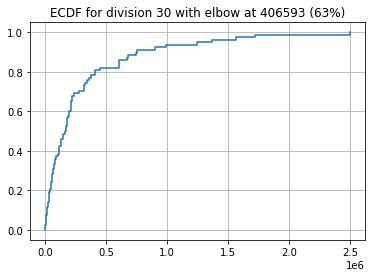

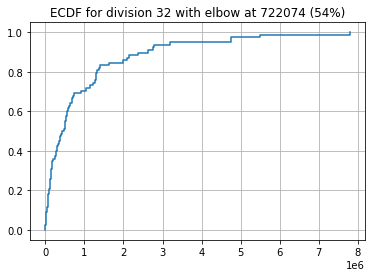

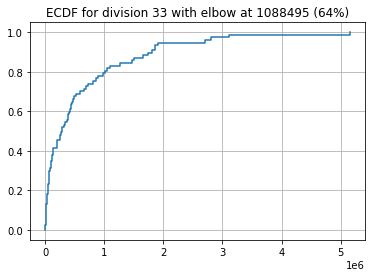

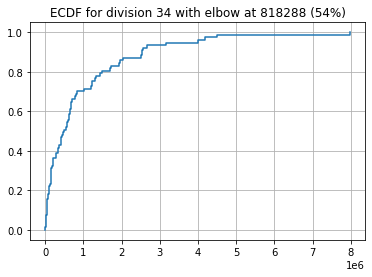

In [0]:
# Analysis for latest month
for div in division_id_list:
    x = pd_df_latest_mth[(pd_df_latest_mth.divison_id == div)]['y']
    x1 = sorted([int(i) for i in x])
    y1 = range(1, len(x1)+1)
    kn = KneeLocator(x1, y1, curve='concave', direction='increasing')
    plot_ecdf(x)
    plt.title(f"ECDF for division {div} with elbow at {kn.knee} ({kn.knee_y}%)")
    plt.show(block = False)

In [0]:
def create_time_features(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df['year'] = df.ds.dt.year
    #df['quarter'] = df.ds.dt.quarter
    df['month'] = df.ds.dt.month
    return df

pd_analysis_df = create_time_features(pd_analysis_df)
month_to_season = {
      1: 0,
      2: 0,
      3: 1,
      4: 1,
      5: 1,
      6: 2,
      7: 2,
      8: 2,
      9: 3,
      10: 3,
      11: 3,
      12: 0
  }
pd_analysis_df['season'] = pd_analysis_df['month'].apply(lambda x: month_to_season[x])

def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(x / period * 2 * np.pi))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(x / period * 2 * np.pi))

def encode_cyclical(df):
    # encode the month with a period of 12
    df['month_sin'] = sin_transformer(12).fit_transform(df['month'])
    df['month_cos'] = cos_transformer(12).fit_transform(df['month'])

    # encode the season with a period of 4
    df['season_sin'] = sin_transformer(4).fit_transform(df['season'])
    df['season_cos'] = cos_transformer(4).fit_transform(df['season'])
    return df

pd_analysis_df = encode_cyclical(pd_analysis_df)

pd_analysis_df.tail()

,unique_id,ds,y,divison_id,year,month,season,quarter,month_sin,month_cos,season_sin,season_cos
23076,3346,2021-08-31,14053,33,2021,8,2,3,-0.866025,-0.5,1.224647e-16,-1.0
23077,3361,2021-08-31,8987,33,2021,8,2,3,-0.866025,-0.5,1.224647e-16,-1.0
23078,3369,2021-08-31,6772,33,2021,8,2,3,-0.866025,-0.5,1.224647e-16,-1.0
23079,3380,2021-08-31,1715,33,2021,8,2,3,-0.866025,-0.5,1.224647e-16,-1.0
23080,3366,2021-08-31,0,33,2021,8,2,3,-0.866025,-0.5,1.224647e-16,-1.0


In [0]:
pd_analysis_df.unique_id.drop_duplicates()

Out[43]: 0       2036
1       2003
2       2008
3       2009
4       2001
        ... 
3413    1769
3414    1780
3415    1777
3416    1766
4115    1767
Name: unique_id, Length: 858, dtype: object

Out[47]: <matplotlib.legend.Legend at 0x7f7ae02b7fd0>

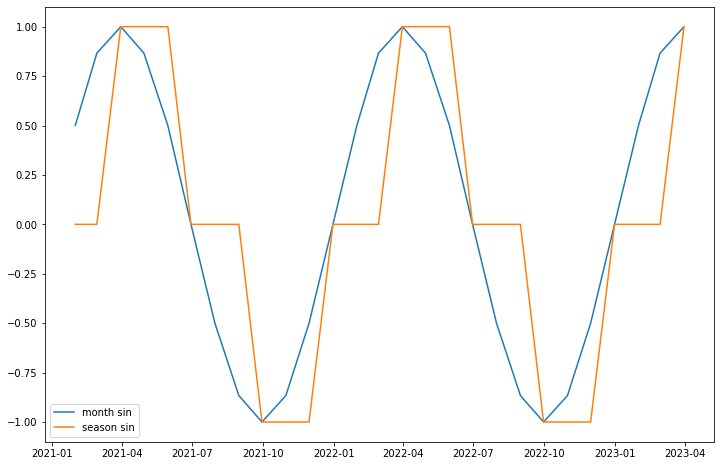

In [0]:
cyc_df_eg = pd_analysis_df[pd_analysis_df.unique_id == '2036'].sort_values(by=['ds'])
fig, ax = plt.subplots(figsize = (12,8))
ax.plot(cyc_df_eg.ds, cyc_df_eg['month_sin'], label='month sin')
ax.plot(cyc_df_eg.ds, cyc_df_eg['season_sin'], label='season sin')
plt.legend()

# **Forecasting**

**Automatic forecasting models(AutoARIMA, AutoETS, AutoCES and AutoTHETA)** models search for the best parameters and select the best possible model for a series of time series. These tools are useful for large collections of univariate time series.

**ARIMA family models(ARIMA and AutoRegressive)** uses existing autocorrelations in the time series and can generate Point Forecast, Probabilistic Forecast,	Insample fitted values and Probabilistic fitted values.

**Theta family models(Theta, OptimizedTheta, DynamicTheta, DynamicOptimizedTheta)** fit two theta lines to a deseasonalized time series, using different techniques to obtain and combine the two theta lines to produce the final forecasts and can generate Point Forecast, Probabilistic Forecast,	Insample fitted values and Probabilistic fitted values.

**Multiple seasonalities model(MSTL)** is suited for signals with more than one clear seasonality. It is useful for low-frequency data like electricity and logs. It can generate Point Forecast, Probabilistic Forecast,	Insample fitted values and Probabilistic fitted values.

**GARCH Models(ARCH and GARCH)** are suited for modeling time series that exhibit non-constant volatility over time. The ARCH(Autoregressive conditional heteroskedasticity) model is a particular case of GARCH. They can generate Point Forecast, Probabilistic Forecast, Insample fitted values and Probabilistic fitted values.

**Baseline Models(HistoricAverage, Naive, RandomWalkWithDrift, SeasonalNaive, WindowAverage, SeasonalWindowAverage)** are the classical models for establishing baseline and HistoricAverage, Naive, RandomWalkWithDrift, SeasonalNaive, SeasonalWindowAverage models generate Point Forecast, Probabilistic Forecast, Insample fitted values and Probabilistic fitted values and WindowAverage, SeasonalWindowAverage can generate only the point foreacst.

**Exponential smoothing models(SimpleExponentialSmoothing, SimpleExponentialSmoothingOptimized, SeasonalExponentialSmoothing, SeasonalExponentialSmoothingOptimized, Holt, HoltWinters)** use a weighted average of all past observations where the weights decrease exponentially into the past. Suitable for data with clear trend and/or seasonality. SimpleExponential family for data with no clear trend or seasonality. Holt, HoltWinters can generate Point Forecast, Probabilistic Forecast, Insample fitted values and Probabilistic fitted values. Other exponential models can only generate the point forecast.

**Sparse or intermittent(ADIDA, CrostonClassic, CrostonOptimized, CrostonSBA, IMAPA, TSB) models** are suited for series with very few non-zero observations and can generate point observations.

In [0]:
pd_train_df = copy.deepcopy(pd_analysis_df[(pd_analysis_df['ds'] >= '2021-01-01 00:00:00') & (pd_analysis_df['ds'] <= '2022-12-31 00:00:00')])
pd_test_df = copy.deepcopy(pd_analysis_df[pd_analysis_df['ds'] > '2022-12-31 00:00:00'])

In [0]:
pd_train_df.head()

,unique_id,ds,y,divison_id,year,month,season,quarter,month_sin,month_cos,season_sin,season_cos
0,2036,2021-02-28,3334042,20,2021,2,0,1,0.866025,0.5,0.0,1.0
1,2003,2021-02-28,2494114,20,2021,2,0,1,0.866025,0.5,0.0,1.0
2,2008,2021-02-28,2421234,20,2021,2,0,1,0.866025,0.5,0.0,1.0
3,2009,2021-02-28,2400675,20,2021,2,0,1,0.866025,0.5,0.0,1.0
4,2001,2021-02-28,1991088,20,2021,2,0,1,0.866025,0.5,0.0,1.0


In [0]:
pd_train_df.set_index('ds', inplace=True)
pd_test_df.set_index('ds', inplace=True)

In [0]:
pd_train_df.columns

Out[73]: Index(['unique_id', 'y', 'divison_id', 'year', 'month', 'season', 'quarter',
       'month_sin', 'month_cos', 'season_sin', 'season_cos'],
      dtype='object')

In [0]:
from sklearn.linear_model import LinearRegression # Linear regression
train_unique_ids = pd_train_df['unique_id'].drop_duplicates().tolist()
test_unique_ids = pd_test_df['unique_id'].drop_duplicates().tolist()
for val_unique_id in train_unique_ids:
    X_train = pd_train_df[pd_train_df.unique_id == val_unique_id][['year', 'month', 'season', 'quarter', 'month_sin', 'month_cos', 'season_sin', 'season_cos']].values
    y_train = pd_train_df[pd_train_df.unique_id == val_unique_id][['y']].values

    X_test = pd_test_df[pd_test_df.unique_id == val_unique_id][['year', 'month', 'season', 'quarter', 'month_sin', 'month_cos', 'season_sin', 'season_cos']].values
    y_test = pd_test_df[pd_test_df.unique_id == val_unique_id][['y']].values

    model = LinearRegression()
    model.fit(X_train, y_train)
    try:
        print(f'Test RMSE using linear regression: {mean_squared_error(y_test, model.predict(X_test), squared=False)} for unique id : {val_unique_id}')
    except:
        print("Error")
    
    '''
    plt.figure(figsize=(14, 10))
    plt.scatter(model.predict(X_test), y_test, alpha=0.01)
    plt.xlabel('Prediction')
    plt.ylabel('Actual')
    plt.title(f'Validation RMSE for Linear model is {mean_squared_error(y_test, model.predict(X_test), squared=False)}')
    '''

Test RMSE using linear regression: 178238.78194539872 for unique id : 2036
Test RMSE using linear regression: 265176.19267862604 for unique id : 2003
Test RMSE using linear regression: 103190.53445304125 for unique id : 2008
Test RMSE using linear regression: 214729.83409868545 for unique id : 2009
Test RMSE using linear regression: 225893.64977374705 for unique id : 2001
Test RMSE using linear regression: 106962.0440529055 for unique id : 2048
Test RMSE using linear regression: 251971.29257166834 for unique id : 2038
Test RMSE using linear regression: 99563.15038374509 for unique id : 2037
Test RMSE using linear regression: 404997.86459314683 for unique id : 2025
Test RMSE using linear regression: 230203.06464119785 for unique id : 2021
Test RMSE using linear regression: 53791.39679073462 for unique id : 2002
Test RMSE using linear regression: 74784.67092234165 for unique id : 2011
Test RMSE using linear regression: 66672.99463348516 for unique id : 2032
Test RMSE using linear regress

**Linear Model**

In [0]:
revenue.groupby('month').apply(lambda x:sum(abs(x['actual'] - x['forecast'])) / sum(abs(x['actual'])))

In [0]:
X_train = pd_train_df[['year', 'month', 'season', 'quarter', 'month_sin', 'month_cos', 'season_sin', 'season_cos']].values
y_train = pd_train_df[['y']].values

X_test = pd_test_df[['year', 'month', 'season', 'quarter', 'month_sin', 'month_cos', 'season_sin', 'season_cos']].values
y_test = pd_test_df[['y']].values

# create dataset for lightgbm
lgb_train = lgb.Dataset(X_train, y_train)
lgb_test = lgb.Dataset(X_test, y_test, reference=lgb_train)

# specify your configurations as a dict
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': {'l2', 'l1'},
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

print('Starting training...')
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=200,
                valid_sets=lgb_test)

print(f'Training RMSE: {mean_squared_error(y_train, gbm.predict(X_train), squared=False)}')
print(f'Test RMSE: {mean_squared_error(y_test, gbm.predict(X_test), squared=False)}')

Starting training...
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l1: 779717	valid_0's l2: 1.43854e+12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l1: 779554	valid_0's l2: 1.43842e+12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l1: 779192	valid_0's l2: 1.43824e+12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l1: 779056	valid_0's l2: 1.43815e+12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's l1: 778729	valid_0's l2: 1.43801e+12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	valid_0's l1: 778595	valid_0's l2: 1.4379

Out[110]: Text(0.5, 1.0, 'Validation RMSE for LightGBM model is 1198457.4909522294')

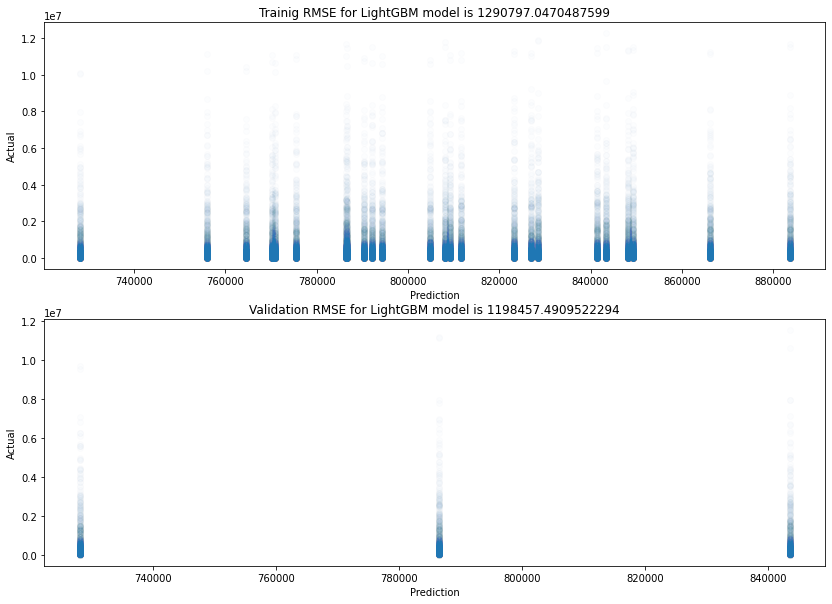

In [0]:
plt.figure(figsize=(14, 10))

plt.subplot(211)
plt.scatter(gbm.predict(X_train), y_train, alpha=0.01)
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Trainig RMSE for LightGBM model is {mean_squared_error(y_train, gbm.predict(X_train), squared=False)}')

plt.subplot(212)
plt.scatter(gbm.predict(X_test), y_test, alpha=0.01)
plt.xlabel('Prediction')
plt.ylabel('Actual')
plt.title(f'Validation RMSE for LightGBM model is {mean_squared_error(y_test, gbm.predict(X_test), squared=False)}')

Out[111]: <AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

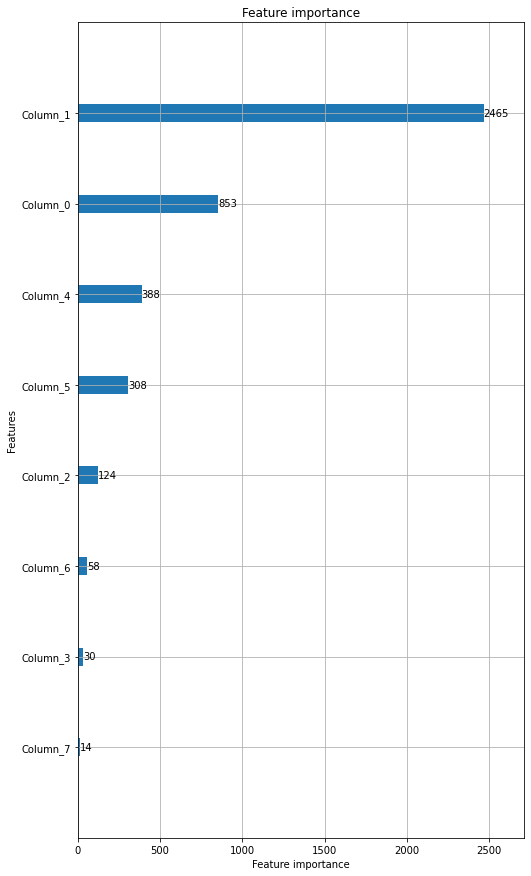

In [0]:
lgb.plot_importance(gbm, max_num_features=20, figsize=(8,15))

In [0]:
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': {'l2', 'l1'},
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 5
}

print('Starting training...')
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=300,
                valid_sets=lgb_test)

Starting training...
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.062530
[LightGBM] [Debug] init for col-wise cost 0.000008 seconds, init for row-wise cost 0.000532 seconds
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Dense Multi-Val Bin
[LightGBM] [Info] Total Bins 56
[LightGBM] [Info] Number of data points in the train set: 20526, number of used features: 8
[LightGBM] [Debug] Use subset for bagging
[LightGBM] [Info] Start training from score 805910.267612
[LightGBM] [Debug] Re-bagging, using 16434 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 9
[1]	valid_0's l1: 779717	valid_0's l2: 1.43854e+12
[LightGBM] [Warning] No further splits with positive gai

In [0]:
print(f'Test RMSE: {mean_squared_error(y_test, gbm.predict(X_test), squared=False)}')

Test RMSE: 1198538.192012158


In [0]:
gbm.predict(X_test)

Out[117]: array([739705.51736871, 739705.51736871, 739705.51736871, ...,
       783623.06421391, 783623.06421391, 783623.06421391])

In [0]:
"""
Automatically selects the best ARIMA (AutoRegressive Integrated Moving Average) model using an information criterion. 
Default is Akaike Information Criterion (AICc).
"""
sf_autoarima = StatsForecast(
    models = [AutoARIMA(season_length = 12)],
    freq = 'M'
)
sf_autoarima.fit(pd_train_df)

Out[17]: StatsForecast(models=[AutoARIMA])

In [0]:
autoarima_forecast_df = sf_autoarima.predict(h=12, level=[90]) 

autoarima_forecast_df.tail()

,ds,AutoARIMA,AutoARIMA-lo-90,AutoARIMA-hi-90
unique_id,,,,
3480,2023-08-31,29406.439453,7943.768555,50869.113281
3480,2023-09-30,29406.435547,7943.749023,50869.125000
3480,2023-10-31,29406.431641,7943.729492,50869.136719
3480,2023-11-30,29406.429688,7943.709961,50869.148438
3480,2023-12-31,29406.425781,7943.689941,50869.160156


In [0]:
pd_df_div_mth_eblow_stats[(pd_df_div_mth_eblow_stats['div'] == '05') & (pd_df_div_mth_eblow_stats['mth'] == '04')]

,div,mth,elbow_avg,elbow_max,elbow_min,elbow_median,elbow_pctl_avg,elbow_pctl_max,elbow_pctl_min,elbow_pctl_median
3,05,04,470217.0,620409,320025,470217.0,58.0,63,54,58.0


In [0]:
autoarima_forecast_df.loc['0534']

,ds,AutoARIMA,AutoARIMA-lo-90,AutoARIMA-hi-90
unique_id,,,,
0534,2023-01-31,63035.476562,49559.609375,76511.343750
0534,2023-02-28,63035.476562,48683.007812,77387.945312
0534,2023-03-31,63035.476562,47856.949219,78214.007812
0534,2023-04-30,63035.476562,47073.582031,78997.375000
0534,2023-05-31,63035.476562,46326.902344,79744.054688
0534,2023-06-30,63035.476562,45612.191406,80458.765625
0534,2023-07-31,63035.476562,44925.664062,81145.289062
0534,2023-08-31,63035.476562,44264.230469,81806.718750
0534,2023-09-30,63035.476562,43625.324219,82445.625000


In [0]:
pd_train_df[pd_train_df.unique_id == '0534'].sort_values(by=['ds'], ascending=False)

,unique_id,ds,y
20733,0534,2022-12-31,69815
8219,0534,2022-11-30,59313
15839,0534,2022-10-31,55155
2237,0534,2022-09-30,59533
10009,0534,2022-08-31,58177
16691,0534,2022-07-31,74323
22908,0534,2022-06-30,61685
19258,0534,2022-05-31,60197
11019,0534,2022-04-30,48638
19103,0534,2022-03-31,56319


In [0]:
sf_autoarima.plot(pd_df[pd_train_df.unique_id == '0534'].sort_values(by=['ds']), autoarima_forecast_df.loc['0534'], level=[90])

<command-3948182232589268>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sf_autoarima.plot(pd_df[pd_train_df.unique_id == '0534'].sort_values(by=['ds']), autoarima_forecast_df.loc['0534'], level=[90])


---------------------------------------------------------------------------
IndexingError                             Traceback (most recent call last)
<command-3948182232589268> in <cell line: 1>()
----> 1 sf_autoarima.plot(pd_df[pd_train_df.unique_id == '0534'].sort_values(by=['ds']), autoarima_forecast_df.loc['0534'], level=[90])

/local_disk0/.ephemeral_nfs/envs/pythonEnv-f749ffb6-c48a-4ee1-a6ec-9839c34e8632/lib/python3.9/site-packages/pandas/core/frame.py in __getitem__(self, key)
   3796         # Do we have a (boolean) 1d indexer?
   3797         if com.is_bool_indexer(key):
-> 3798             return self._getitem_bool_array(key)
   3799 
   3800         # We are left with two options: a single key, and a collection of keys,

/local_disk0/.ephemeral_nfs/envs/pythonEnv-f749ffb6-c48a-4ee1-a6ec-9839c34e8632/lib/python3.9/site-packages/pandas/core/frame.py in _getitem_bool_array(self, key)
   3849         # check_bool_indexer will throw exception if Series key cannot
   3850       

In [0]:
sf_autoarima.plot(pd_df[pd_train_df.unique_id == '1934'].sort_values(by=['ds']), autoarima_forecast_df.loc['1934'], level=[90])

<command-4171701375310563>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sf_autoarima.plot(pd_df[pd_train_df.unique_id == '1934'].sort_values(by=['ds']), autoarima_forecast_df.loc['1934'], level=[90])


---------------------------------------------------------------------------
IndexingError                             Traceback (most recent call last)
<command-4171701375310563> in <cell line: 1>()
----> 1 sf_autoarima.plot(pd_df[pd_train_df.unique_id == '1934'].sort_values(by=['ds']), autoarima_forecast_df.loc['1934'], level=[90])

/local_disk0/.ephemeral_nfs/envs/pythonEnv-f749ffb6-c48a-4ee1-a6ec-9839c34e8632/lib/python3.9/site-packages/pandas/core/frame.py in __getitem__(self, key)
   3796         # Do we have a (boolean) 1d indexer?
   3797         if com.is_bool_indexer(key):
-> 3798             return self._getitem_bool_array(key)
   3799 
   3800         # We are left with two options: a single key, and a collection of keys,

/local_disk0/.ephemeral_nfs/envs/pythonEnv-f749ffb6-c48a-4ee1-a6ec-9839c34e8632/lib/python3.9/site-packages/pandas/core/frame.py in _getitem_bool_array(self, key)
   3849         # check_bool_indexer will throw exception if Series key cannot
   3850       

In [0]:
pd_train_df[pd_train_df.unique_id == '0536'].sort_values(by=['ds'], ascending=False)

,unique_id,ds,y
20674,0536,2022-12-31,3561652
8159,0536,2022-11-30,3436776
15777,0536,2022-10-31,3432373
2175,0536,2022-09-30,3348270
9947,0536,2022-08-31,3465800
16632,0536,2022-07-31,3470400
22848,0536,2022-06-30,3323565
19198,0536,2022-05-31,3432002
10957,0536,2022-04-30,3308855
19042,0536,2022-03-31,3495248


In [0]:
autoarima_forecast_df.loc['0536']

,ds,AutoARIMA,AutoARIMA-lo-90,AutoARIMA-hi-90
unique_id,,,,
0536,2023-01-31,3470719.25,3141446.25,3799992.25
0536,2023-02-28,3470696.75,3140802.00,3800591.75
0536,2023-03-31,3470674.25,3140158.75,3801190.00
0536,2023-04-30,3470652.00,3139517.00,3801787.00
0536,2023-05-31,3470629.50,3138876.00,3802382.75
0536,2023-06-30,3470607.00,3138236.50,3802977.50
0536,2023-07-31,3470584.50,3137598.00,3803571.00
0536,2023-08-31,3470562.25,3136960.75,3804163.50
0536,2023-09-30,3470539.75,3136324.50,3804754.75


In [0]:
sf_autoarima.plot(pd_train_df[pd_train_df.unique_id == '0536'].sort_values(by=['ds']), autoarima_forecast_df.loc['0536'], level=[90])